In [2]:
import nilearn
import os
import hcp_utils as hcp
from nibabel.testing import data_path
from nilearn import datasets, plotting, regions
import brainspace
import pandas as pd
import numpy as np
import seaborn as sns
import nibabel as nib
import matplotlib.pyplot as plt
from brainspace.utils.parcellation import map_to_labels, reduce_by_labels
from nilearn import signal
from brainspace.gradient import GradientMaps
from nilearn.maskers import NiftiLabelsMasker
from brainspace.gradient.alignment import ProcrustesAlignment

from brainspace.datasets import load_conte69, load_parcellation
from brainspace.plotting import plot_hemispheres
surf_lh, surf_rh = load_conte69()

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [3]:
def parcellate_margulies(grads, n_grad = 26, parc = "schaefer", n_parc = 1000):
    
    parcellation = load_parcellation(parc, scale=n_parc, join=True)
    margulies_grads = nib.load(grads).get_fdata()[:n_grad, :]
    margulies_grads = np.array([hcp.cortex_data(i) for i in margulies_grads])
    parc_grads = np.array([reduce_by_labels(i, parcellation) for i in margulies_grads])
    return parc_grads

In [3]:
nib.load('/Users/VictoriaShevchenko/Documents/PhD/HCP/Gradients_Margulies2016/hcp.gradients.dscalar.nii').get_fdata().shape

(26, 91282)

In [2]:
import matplotlib
matplotlib.use('module://ipykernel.pylab.backend_inline')

In [ ]:
pd.re

In [4]:
schaefer_labels_1000 = load_parcellation('schaefer', scale=1000, join=True)

In [11]:
type(schaefer_labels_1000[0])

numpy.int64

# Preprocessing

### Visualize Schaefer-400 atlas 

In [3]:
from neuromaps.datasets import fetch_fslr
from surfplot import Plot
from brainspace.datasets import load_parcellation

surfaces = fetch_fslr()
lh, rh = surfaces['inflated']
lh_parc, rh_parc = load_parcellation('schaefer')

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_23859/941990118.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


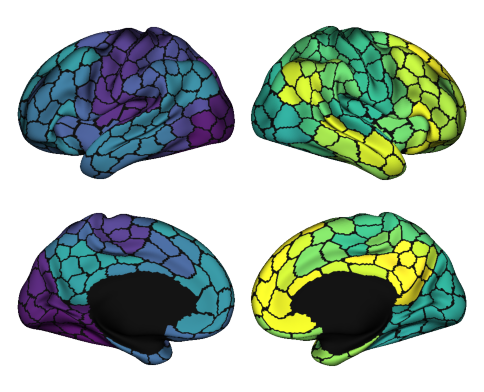

In [4]:
schaefer = Plot(lh, rh)
schaefer.add_layer({'left': lh_parc, 'right': rh_parc}, cbar=False)
schaefer.add_layer({'left': lh_parc, 'right': rh_parc}, cmap='gray',
            as_outline=True, cbar=False)


fig = schaefer.build()
fig.show()

## Load confounds & timeseries

In [3]:
confounds_file = '/Users/VictoriaShevchenko/Documents/PhD/COBRE/sub-A00000909/ses-20110101/func/sub-A00000909_ses-20110101_task-rest_run-1_desc-confounds_timeseries.tsv'
confounds_out_s1 = pd.read_csv(confounds_file, sep = '\t')
confounds_file = '/Users/VictoriaShevchenko/Documents/PhD/COBRE/sub-A00000909/ses-20110101/func/sub-A00000909_ses-20110101_task-rest_run-2_desc-confounds_timeseries.tsv'
confounds_out_s2 = pd.read_csv(confounds_file, sep = '\t')

pd.DataFrame.isna(confounds_out_s1).any().any()

picked_confounds = np.loadtxt('sub-A00018979/confounds.txt', dtype = 'str')

from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
confounds_out_s1 = pd.DataFrame(imputer.fit_transform(confounds_out_s1), columns=confounds_out_s1.columns)[picked_confounds[1:]]
confounds_out_s2 = pd.DataFrame(imputer.fit_transform(confounds_out_s2), columns=confounds_out_s2.columns)[picked_confounds[1:]]


True

In [4]:
# Define the paths to the functional images

subj_ts_s1 = '/Users/VictoriaShevchenko/Documents/PhD/COBRE/sub-A00000909/ses-20110101/func/sub-A00000909_ses-20110101_task-rest_run-1_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz'
subj_ts_s2 = '/Users/VictoriaShevchenko/Documents/PhD/COBRE/sub-A00000909/ses-20110101/func/sub-A00000909_ses-20110101_task-rest_run-2_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz'


## Check timeseries of a single voxel

In [116]:
subj_ts_s1_ts = nib.load(subj_ts_s1).get_fdata()

<Figure size 1000x200 with 0 Axes>

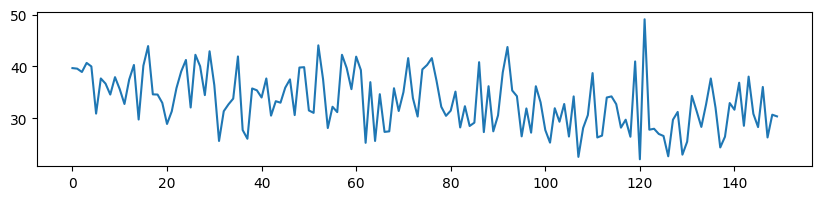

In [108]:
plt.figure(figsize = (10, 2))
plt.plot(subj_ts_s1_ts[20, 20, 20, :])

## Compute timiseries per parcel: Schaefer-400

In [88]:
schaefer_atlas = nilearn.datasets.fetch_atlas_schaefer_2018(n_rois=1000, yeo_networks=17, resolution_mm=1, data_dir=None, base_url=None, resume=True, verbose=1)
schaefer_masker =  NiftiLabelsMasker(labels_img=schaefer_atlas.maps, standardize=True, memory='nilearn_cache', verbose=5) #apply paarcellation to timeseries

 ...done. (0 seconds, 0 min)


 ...done. (0 seconds, 0 min)


In [117]:
confounds_out_s1

,csf,white_matter,trans_x,trans_x_derivative1,trans_x_derivative1_power2,trans_x_power2,trans_y,trans_y_derivative1,trans_y_power2,trans_y_derivative1_power2,...,rot_x_derivative1_power2,rot_x_power2,rot_y,rot_y_derivative1,rot_y_derivative1_power2,rot_y_power2,rot_z,rot_z_derivative1,rot_z_power2,rot_z_derivative1_power2
0,1179.214633,805.658380,0.459596,-0.009041,0.001634,0.211228,0.073272,0.001357,0.005369,0.059120,...,2.213297e-06,0.000039,-0.000382,-1.037250e-05,2.435059e-07,1.456773e-07,0.006496,-0.000141,0.000042,3.062176e-07
1,1145.967271,805.822282,0.409468,-0.050128,0.002513,0.167664,0.124094,0.050822,0.015399,0.002583,...,7.110489e-06,0.000080,-0.000907,-5.256030e-04,2.762585e-07,8.231570e-07,0.004813,-0.001683,0.000023,2.832220e-06
2,1137.322691,803.525304,0.424851,0.015383,0.000237,0.180498,0.114132,-0.009962,0.013026,0.000099,...,3.609847e-07,0.000091,-0.000521,3.864300e-04,1.493281e-07,2.712847e-07,0.004546,-0.000267,0.000021,7.102758e-08
3,1134.079758,804.197845,0.412350,-0.012501,0.000156,0.170033,0.104872,-0.009260,0.010998,0.000086,...,6.250000e-08,0.000096,-0.000318,2.026830e-04,4.108040e-08,1.012302e-07,0.004449,-0.000097,0.000020,9.463398e-09
4,1126.898977,803.340001,0.233349,-0.179001,0.032041,0.054452,-0.057285,-0.162157,0.003282,0.026295,...,3.877630e-06,0.000061,-0.000318,5.170000e-07,2.672890e-13,1.009015e-07,0.002486,-0.001963,0.000006,3.853644e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,1132.122480,797.182379,-0.829678,-0.041044,0.001685,0.688366,0.670800,0.346793,0.449973,0.120265,...,1.381734e-05,0.000020,-0.002148,9.971300e-04,9.942682e-07,4.615537e-06,-0.014024,-0.000678,0.000197,4.590063e-07
146,1124.516560,799.013226,-0.843719,-0.014041,0.000197,0.711862,0.316325,-0.354475,0.100062,0.125653,...,1.270467e-06,0.000011,-0.002759,-6.106300e-04,3.728690e-07,7.612136e-06,-0.013667,0.000357,0.000187,1.277348e-07
147,1112.081305,795.074533,-0.861729,-0.018010,0.000324,0.742577,0.564496,0.248171,0.318656,0.061589,...,9.080278e-06,0.000040,-0.002064,6.945900e-04,4.824553e-07,4.261830e-06,-0.014351,-0.000684,0.000206,4.678560e-07
148,1127.686802,795.556421,-0.871628,-0.009899,0.000098,0.759735,0.537100,-0.027396,0.288476,0.000751,...,6.152206e-07,0.000050,-0.001866,1.982800e-04,3.931496e-08,3.482478e-06,-0.014560,-0.000209,0.000212,4.363921e-08


In [200]:
clean_ts_s1 = schaefer_masker.fit_transform(subj_ts_s1, confounds = confounds_out_s1)
clean_ts_s2 = schaefer_masker.fit_transform(subj_ts_s2, confounds = confounds_out_s2)

[NiftiLabelsMasker.fit_transform] loading data from /Users/VictoriaShevchenko/nilearn_data/schaefer_2018/Schaefer2018_400Parcels_7Networks_order_FSLMNI152_1mm.nii.gz
Resampling labels
________________________________________________________________________________
[Memory] Calling nilearn.maskers.base_masker._filter_and_extract...
_filter_and_extract('/Users/VictoriaShevchenko/Documents/PhD/COBRE/sub-A00000909/ses-20110101/func/sub-A00000909_ses-20110101_task-rest_run-1_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz', 
{ 'background_label': 0,
  'detrend': False,
  'dtype': None,
  'high_pass': None,
  'high_variance_confounds': False,
  'labels': None,
  'labels_img': '/Users/VictoriaShevchenko/nilearn_data/schaefer_2018/Schaefer2018_400Parcels_7Networks_order_FSLMNI152_1mm.nii.gz',
  'low_pass': None,
  'mask_img': None,
  'reports': True,
  'smoothing_fwhm': None,
  'standardize': True,
  'standardize_confounds': True,
  'strategy': 'mean',
  't_r': None,
  'target_affine'

In [202]:
clean_ts_s1.shape
clean_ts_s2.shape

(150, 400)

(150, 400)

## Check the frequency field. Not good.

Text(0.5, 0, 'Frequency (Hz)')

Text(0, 0.5, 'Power Spectral Density')

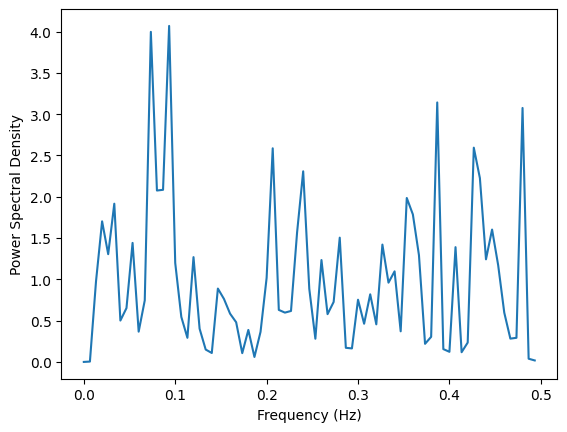

In [74]:
# Compute the FFT of the timeseries along the time axis (axis=0)
fft_data = np.fft.fft(clean_ts_s1, axis=0)

# Compute the FFT of the timeseries along the time axis (axis=0)
fft_data = np.fft.fft(clean_ts_s1, axis=0)

# Compute the power spectral density (PSD) of the FFT data
freqs = np.fft.fftfreq(clean_ts_s1.shape[0])
psd = np.abs(fft_data)**2 / clean_ts_s1.shape[0]

# Plot the frequency field
plt.plot(freqs[:clean_ts_s1.shape[0]//2], psd[:clean_ts_s1.shape[0]//2, 0])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')
plt.show()

## Clean the signal

In [120]:
clean_ts_s1 = signal.clean(clean_ts_s1, t_r=2, low_pass=0.08, high_pass=0.01, standardize=True, detrend=True)
clean_ts_s2 = signal.clean(clean_ts_s2, t_r=2, low_pass=0.08, high_pass=0.01, standardize=True, detrend=True)

In [13]:
clean_ts = np.row_stack([clean_ts_s1[10:], clean_ts_s2[10:]])

## Check the frequency field. That's more like it.

Text(0.5, 0, 'Frequency (Hz)')

Text(0, 0.5, 'Power Spectral Density')

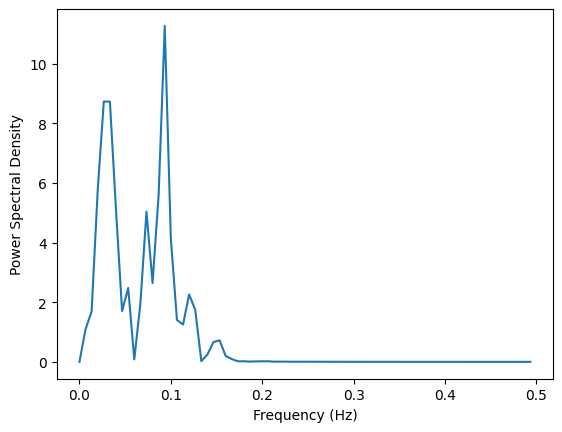

In [76]:
# Compute the FFT of the timeseries along the time axis (axis=0)
fft_data = np.fft.fft(clean_ts_s1, axis=0)

# Compute the FFT of the timeseries along the time axis (axis=0)
fft_data = np.fft.fft(clean_ts_s1, axis=0)

# Compute the power spectral density (PSD) of the FFT data
freqs = np.fft.fftfreq(clean_ts_s1.shape[0])
psd = np.abs(fft_data)**2 / clean_ts_s1.shape[0]

# Plot the frequency field
plt.plot(freqs[:clean_ts_s1.shape[0]//2], psd[:clean_ts_s1.shape[0]//2, 0])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')
plt.show()

## Check 1 voxel and check the parcellation.

<Figure size 1000x200 with 0 Axes>

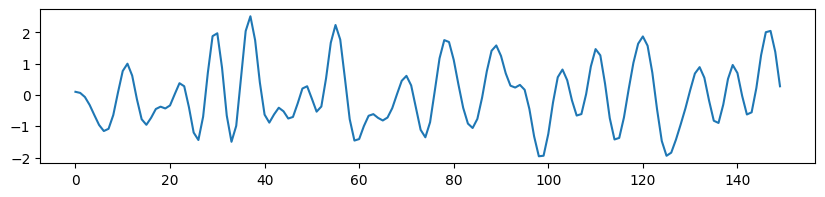

In [77]:
plt.figure(figsize = (10, 2))
plt.plot(clean_ts_s1[:, 140])

[NiftiLabelsMasker.inverse_transform] computing image from signals


/Users/VictoriaShevchenko/.local/lib/python3.9/site-packages/nilearn/plotting/img_plotting.py:300: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


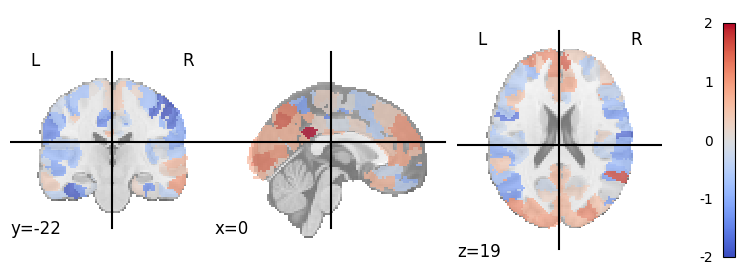

In [67]:
plotting.plot_roi(schaefer_masker.inverse_transform(clean_ts_s1).slicer[:,:,:,100], colorbar=True, cmap = "coolwarm", threshold = 0.000001)

# Extract Gradients

### Load Schaefer-400 on fsLR 32k surface.
#### Map parcellated timeseries onto fsLR surface.

In [13]:
scz_path = 'clean_data/SCZ/schaefer1000'
controls_path = 'clean_data/controls/schaefer1000'

In [5]:
schaefer_labels = load_parcellation('schaefer', scale=1000, join=True)

#### pick subject

In [79]:
subject = "A00019293"

In [80]:
subj_clean_ts = np.load(f"clean_data/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_desc-clean_bold.npy")
subj_clean_ts = np.row_stack(subj_clean_ts)

In [81]:
subj_correlation_matrix = np.corrcoef(subj_clean_ts.T)

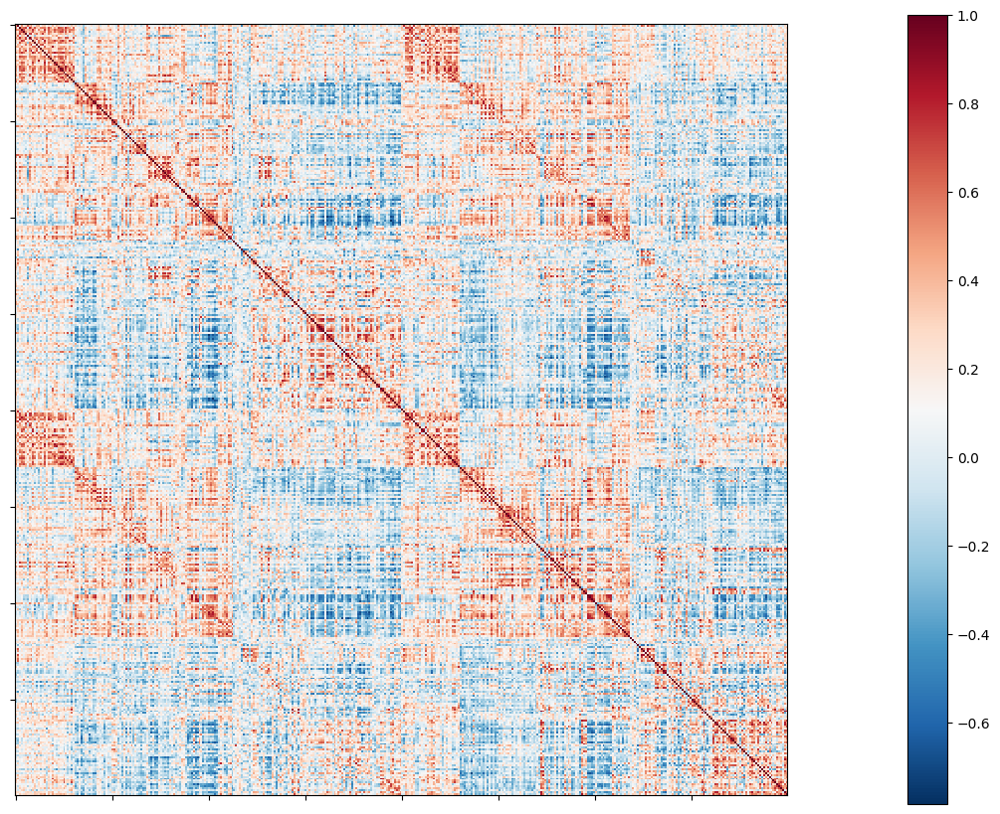

In [82]:
corr_plot = plotting.plot_matrix(subj_correlation_matrix, figure=(10, 10))

In [7]:
gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
gm.fit(subj_correlation_matrix)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [10]:
grad_subj = [None] * 3

for i, g in enumerate(gm.gradients_.T):
    grad_subj[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

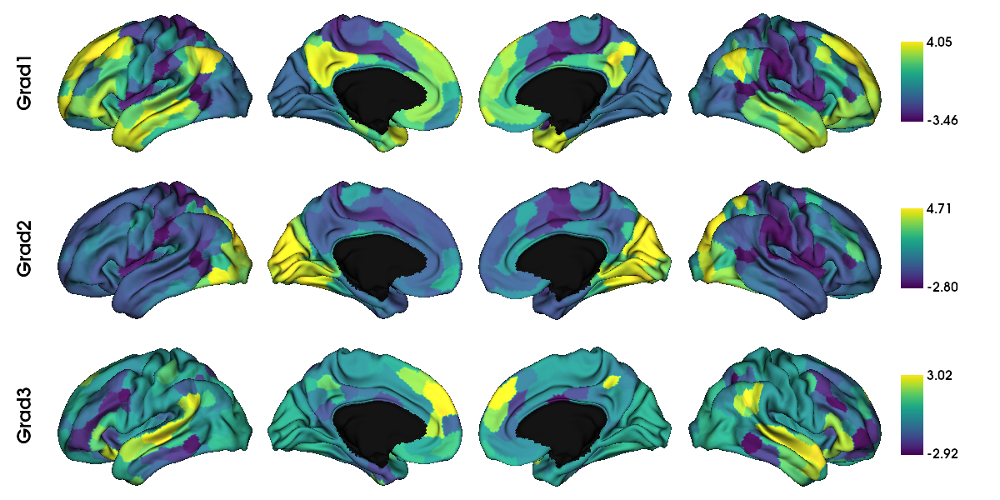

In [11]:
plot_hemispheres(surf_lh, surf_rh, array_name=grad_subj, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

# Schaefer 1000: individuals

In [8]:
scz_subjects = np.loadtxt("COBRE_SCZ_subjects.txt", dtype = str)
control_subjects = np.loadtxt("COBRE_controls_subjects.txt", dtype = str)
n_parcels = 1000


In [17]:
x = os.listdir("clean_data/SCZ/schaefer1000/sub-A00000541/func")

In [19]:
ts_ses_dict = {}
for key in np.arange(len(x)):
    ts_ses_dict[key + 1] = None

In [42]:
subj_dir = f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func"
ts_paths = [path for path in os.listdir(subj_dir) if "task-rest" in path]

if len(ts_paths) > 1:
    ts_ses2 = np.load(f"{subj_dir}/{ts_paths[0]}")
    ts_ses1 = np.load(f"{subj_dir}/{ts_paths[1]}")
    subj_ts = np.row_stack([ts_ses1, ts_ses2])
else:
    subj_ts = np.load(f"{subj_dir}/{ts_paths[0]}")

FileNotFoundError: [Errno 2] No such file or directory: 'clean_data/SCZ/schaefer1000/sub-A00037007/func'

In [35]:
subj_ts.shape

(140, 1000)

In [48]:
# Save conn matrices for each subject

for subject in scz_subjects:
    subj_dir = f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func"
    ts_paths = [path for path in os.listdir(subj_dir) if "task-rest" in path]
    
    if len(ts_paths) > 1:
        ts_ses2 = np.load(f"{subj_dir}/{ts_paths[0]}")
        ts_ses1 = np.load(f"{subj_dir}/{ts_paths[1]}")

        subj_ts = np.row_stack([ts_ses1, ts_ses2])
    else:
        subj_ts = np.load(f"{subj_dir}/{ts_paths[0]}")

    conn_mat = np.corrcoef(subj_ts.T)
    conn_mat =np.arctanh(conn_mat)

    np.save(f'{subj_dir}/z_conn_matrix_{subject}_schaefer1000', conn_mat)


for subject in control_subjects:
    subj_dir = f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func"
    ts_paths = [path for path in os.listdir(subj_dir) if "task-rest" in path]
    
    if len(ts_paths) > 1:
        ts_ses2 = np.load(f"{subj_dir}/{ts_paths[0]}")
        ts_ses1 = np.load(f"{subj_dir}/{ts_paths[1]}")
        subj_ts = np.row_stack([ts_ses1, ts_ses2])
    else:
        subj_ts = np.load(f"{subj_dir}/{ts_paths[0]}")

    conn_mat = np.corrcoef(subj_ts.T)
    conn_mat =np.arctanh(conn_mat)

    np.save(f'{subj_dir}/z_conn_matrix_{subject}_schaefer1000', conn_mat)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_34287/3012370929.py:16: RuntimeWarning: divide by zero encountered in arctanh
  conn_mat =np.arctanh(conn_mat)
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_34287/3012370929.py:33: RuntimeWarning: divide by zero encountered in arctanh
  conn_mat =np.arctanh(conn_mat)


## Extract Gradients

In [76]:
zcorr = np.load(f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/z_conn_matrix_{subject}_schaefer1000.npy")

In [47]:
zcorr.shape

(140, 140)

In [72]:
n_grads = 10

for subject in scz_subjects:
    zcorr = np.load(f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/z_conn_matrix_{subject}_schaefer1000.npy")
    if np.isnan(zcorr).any():
        nan_indices = np.where(np.isnan(zcorr))
        zcorr[nan_indices] = .0000000001
    if np.isinf(zcorr).any():
        inf_indices = np.where(np.isinf(zcorr))
        zcorr[inf_indices] = 1
    gm = GradientMaps(n_components=n_grads, kernel = "cosine", approach= 'pca')
    gm.fit(zcorr)
    np.save(f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000", gm.gradients_)


for subject in control_subjects:
    zcorr = np.load(f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/z_conn_matrix_{subject}_schaefer1000.npy")
    if np.isnan(zcorr).any():
        nan_indices = np.where(np.isnan(zcorr))
        zcorr[nan_indices] = .0000000001
    if np.isinf(zcorr).any():
        inf_indices = np.where(np.isinf(zcorr))
        zcorr[inf_indices] = 1
    gm = GradientMaps(n_components=n_grads, kernel = "cosine", approach= 'pca')
    gm.fit(zcorr)
    np.save(f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000", gm.gradients_)

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

## Align Gradients

In [29]:
margulies_2016 = parcellate_margulies('/Users/VictoriaShevchenko/Documents/PhD/HCP/Gradients_Margulies2016/hcp.gradients.dscalar.nii', 10)
np.save("margulies_grads_schaefer1000", margulies_2016)

In [73]:
# gradient alignment
for subject in scz_subjects:
    subj_grads = np.load(f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy")
    aligned_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(subj_grads, axis = 0), margulies_2016.T).aligned_[0]
    np.save(f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/aligned_{n_grads}grads_{subject}_schaefer1000", aligned_grads)
    os.remove(f'clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy')

for subject in control_subjects:
    subj_grads = np.load(f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy")
    aligned_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(subj_grads, axis = 0), margulies_2016.T).aligned_[0]
    np.save(f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/aligned_{n_grads}grads_{subject}_schaefer1000", aligned_grads)
    os.remove(f'clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/{n_grads}grads_{subject}_schaefer1000.npy')


Iteration   0: 18619.132683
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 21368.990427
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 23016.894812
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 22286.680018
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 27965.078327
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 24276.398824
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 24947.833022
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 21468.310120
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 24916.952371
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 22046.130660
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 23912.731898
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 26030.660787
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 27439.753532
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   

In [77]:
# sanity check
subject = 'A00000909'
aligned_grads = np.load(f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/aligned_{n_grads}grads_{subject}_schaefer1000.npy")


grad_mapped= [None]  * 3
for i, g in enumerate(aligned_grads.T[:3]):
    grad_mapped[i] = map_to_labels(g, schaefer_labels_1000, mask=schaefer_labels_1000 != 0, fill=np.nan)

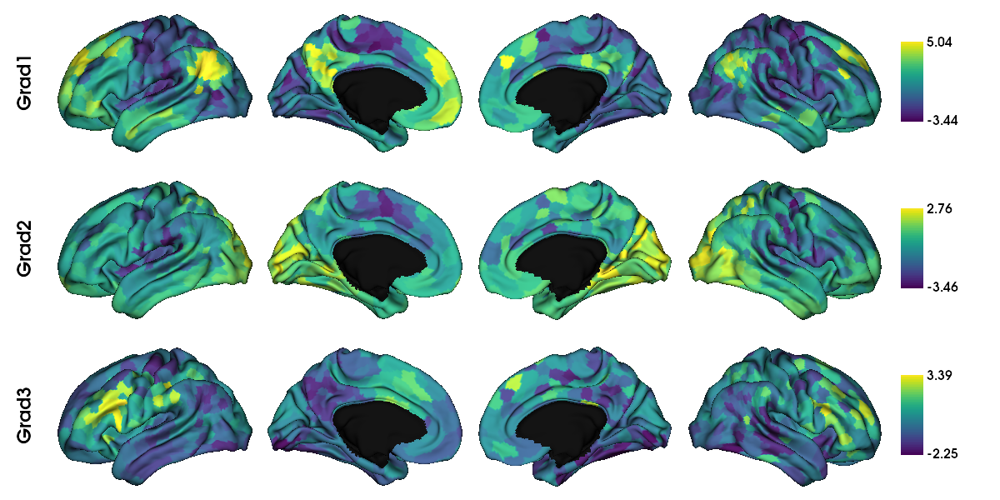

In [78]:
surf_lh, surf_rh = load_conte69()
plot_hemispheres(surf_lh, surf_rh, array_name=grad_mapped, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

## Group Gradients

In [14]:
scz_conn_matrices = []
control_conn_matrices = []

for subject in scz_subjects:
    subj_dir = f"{scz_path}/sub-{subject}/func"
    conn_mat = np.load(f"{subj_dir}/z_conn_matrix_{subject}_schaefer1000.npy")
    scz_conn_matrices.append(conn_mat)
scz_conn_matrices = np.asarray(scz_conn_matrices)

for subject in control_subjects:
    subj_dir = f"{controls_path}/sub-{subject}/func"
    conn_mat = np.load(f"{subj_dir}/z_conn_matrix_{subject}_schaefer1000.npy")
    control_conn_matrices.append(conn_mat)
control_conn_matrices = np.asarray(control_conn_matrices)

In [15]:
scz_conn_matrices.shape
control_conn_matrices.shape

(73, 1000, 1000)

(91, 1000, 1000)

In [24]:
scz_conn_mean = np.mean(scz_conn_matrices, axis = 0)
control_conn_mean = np.mean(control_conn_matrices, axis = 0)

scz_conn_mean = np.tanh(scz_conn_mean)
if np.isnan(scz_conn_mean).any():
    nan_indices = np.where(np.isnan(scz_conn_mean))
    scz_conn_mean[nan_indices] = .0000000001
if np.isinf(scz_conn_mean).any():
    inf_indices = np.where(np.isinf(scz_conn_mean))
    scz_conn_mean[inf_indices] = 1

control_conn_matrices = np.tanh(control_conn_mean)
if np.isnan(control_conn_mean).any():
    nan_indices = np.where(np.isnan(control_conn_mean))
    control_conn_matrices[nan_indices] = .0000000001
if np.isinf(control_conn_mean).any():
    inf_indices = np.where(np.isinf(control_conn_mean))
    control_conn_mean[inf_indices] = 1


np.save(arr = scz_conn_mean, file = f"{scz_path}/scz_group_conn_matrix_schaefer1000")
np.save(arr = control_conn_mean, file = f"{controls_path}/control_group_conn_matrix_schaefer1000")



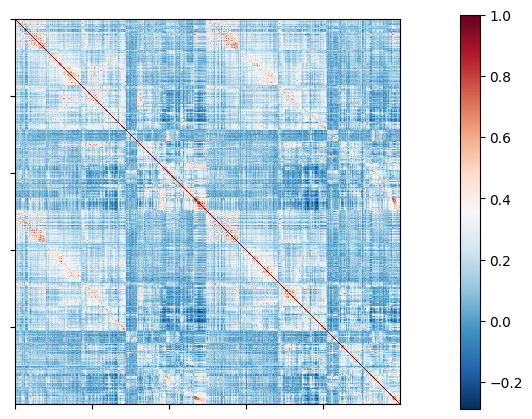

In [25]:
corr_plot = plotting.plot_matrix(scz_conn_mean, figure=(5, 5))

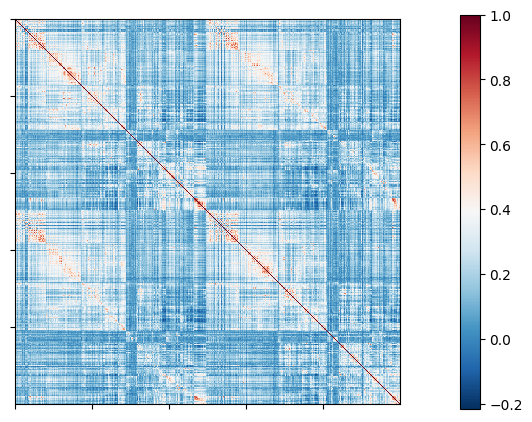

In [26]:
corr_plot = plotting.plot_matrix(control_conn_mean, figure=(5, 5))

In [27]:
gm = GradientMaps(n_components=10, kernel = "cosine", approach= 'pca')
gm.fit(scz_conn_mean)
np.save(f"clean_data/SCZ/schaefer{n_parcels}/scz_group_10grads_schaefer1000", gm.gradients_)


gm = GradientMaps(n_components=10, kernel = "cosine", approach= 'pca')
gm.fit(control_conn_mean)
np.save(f"clean_data/controls/schaefer{n_parcels}/control_group_10grads_schaefer1000", gm.gradients_)


GradientMaps(approach='pca', kernel='cosine')

GradientMaps(approach='pca', kernel='cosine')

In [31]:
# align group gradients

scz_group_grads = np.load(f"clean_data/SCZ/schaefer{n_parcels}/scz_group_10grads_schaefer1000.npy")
aligned_scz_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(scz_group_grads, axis = 0), margulies_2016.T).aligned_[0]
np.save(f"clean_data/SCZ/schaefer{n_parcels}/aligned_schz_group_10grads_schaefer1000", aligned_scz_grads)

control_group_grads = np.load(f"clean_data/controls/schaefer{n_parcels}/control_group_10grads_schaefer1000.npy")
aligned_control_grads = ProcrustesAlignment(verbose=True).fit(np.expand_dims(control_group_grads, axis = 0), margulies_2016.T).aligned_[0]
np.save(f"clean_data/controls/schaefer{n_parcels}/aligned_control_group_10grads_schaefer1000", aligned_control_grads)


Iteration   0: 15640.613104
Iteration   1: 0.000000
Iteration   2: 0.000000
Iteration   0: 14685.681958
Iteration   1: 0.000000
Iteration   2: 0.000000


In [32]:
aligned_scz_grads.shape

(1000, 10)

In [33]:
labeled_scz_group_grad = [None] * 3
labeled_controls_group_grad = [None] * 3

for i, g in enumerate(aligned_scz_grads[:, :3].T):
    labeled_scz_group_grad[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

for i, g in enumerate(aligned_control_grads[:, :3].T):
    labeled_controls_group_grad[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)


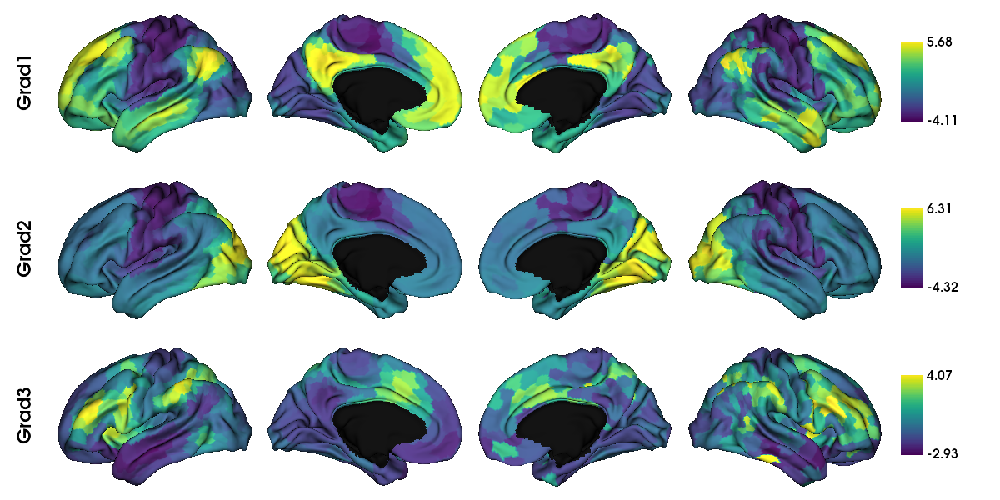

In [34]:
plot_hemispheres(surf_lh, surf_rh, array_name=labeled_scz_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

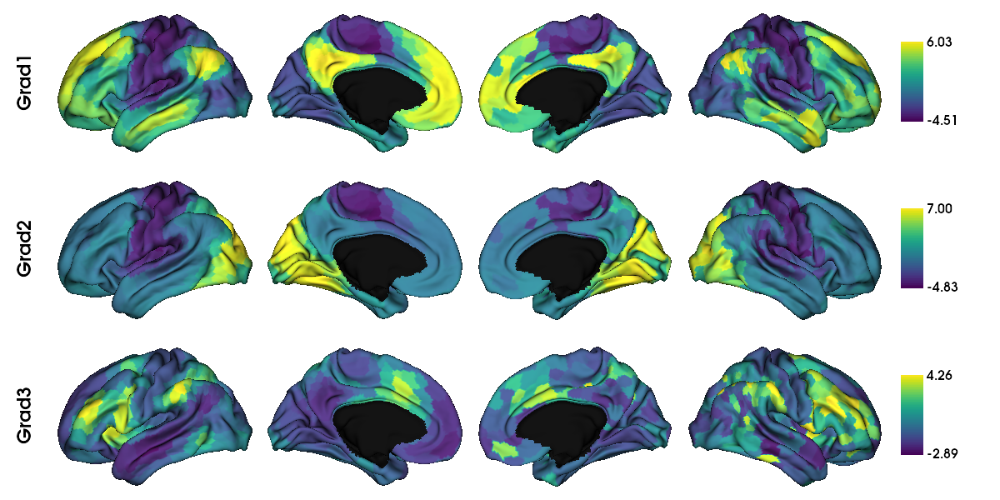

In [36]:
plot_hemispheres(surf_lh, surf_rh, array_name=labeled_controls_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [46]:
np.save(arr = gm.gradients_.T, file = "clean_data/gradients/SCZ/schaefer400/scz_group_grads.npy")

: 

In [84]:
scz_group_grad_df = pd.DataFrame(gm.gradients_, columns = ["Grad 1", "Grad 2", "Grad 3"])

In [86]:
import plotly.express as px

fig = px.scatter_3d(scz_group_grad_df, x="Grad 2", y="Grad 3", z="Grad 1",
              color="Grad 2", color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 3)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

In [7]:
import os
n_parcels = 400
for subject in scz_subjects:
    output_dir = f"clean_data/gradients/SCZ/schaefer{n_parcels}/sub-{subject}"
    subject_ts_path = f"clean_data/SCZ/schaefer{n_parcels}/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer{n_parcels}_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    conn = np.corrcoef(subject_ts.T)
    np.save(arr = conn, file = f"{output_dir}/{subject}_conn_matrix")
    gm = GradientMaps(n_components=10, kernel = "cosine", approach= 'pca')
    gm.fit(conn)
    np.save(arr = gm.gradients_.T, file = f"{output_dir}/{subject}_gradients")
    

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [9]:
for subject in control_subjects:
    output_dir = f"clean_data/gradients/controls/schaefer{n_parcels}/sub-{subject}"
    subject_ts_path = f"clean_data/controls/schaefer{n_parcels}/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer{n_parcels}_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    conn = np.corrcoef(subject_ts.T)
    np.save(arr = conn, file = f"{output_dir}/{subject}_conn_matrix")
    gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
    gm.fit(conn)
    np.save(arr = gm.gradients_.T, file = f"{output_dir}/{subject}_gradients")

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

# Schaefer 1000

In [90]:
ts = []
for subject in subjects:
    subject_ts_path = f"/Users/VictoriaShevchenko/Documents/PhD/COBRE/clean_data/SCZ/schaefer1000/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer1000_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    ts.append(subject_ts)

In [91]:
conn_matrices = []
for subject_ts in ts:
    #conn = np.corrcoef(subject_ts.T)
    conn = np.arctanh(np.corrcoef(subject_ts.T))
    conn_matrices.append(conn)
conn_matrices = np.asarray(conn_matrices)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_57549/141645875.py:4: RuntimeWarning:

divide by zero encountered in arctanh



In [92]:
conn_mean = np.mean(conn_matrices, axis = 0)
conn_mean = np.tanh(conn_mean)
conn_mean.shape

(1000, 1000)

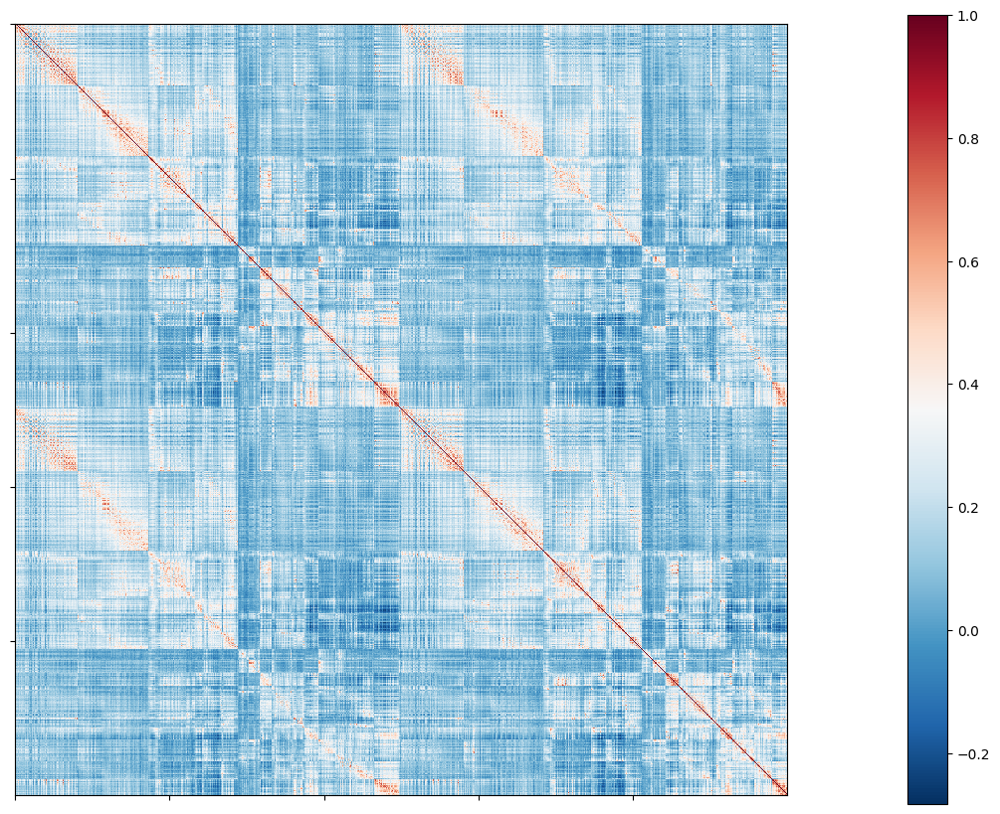

In [93]:
corr_plot = plotting.plot_matrix(conn_mean, figure=(10, 10))

In [94]:
gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
gm.fit(conn_mean)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [95]:
scz_group_grad_schaefer1000 = [None] * 3

for i, g in enumerate(gm.gradients_.T):
    scz_group_grad_schaefer1000[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

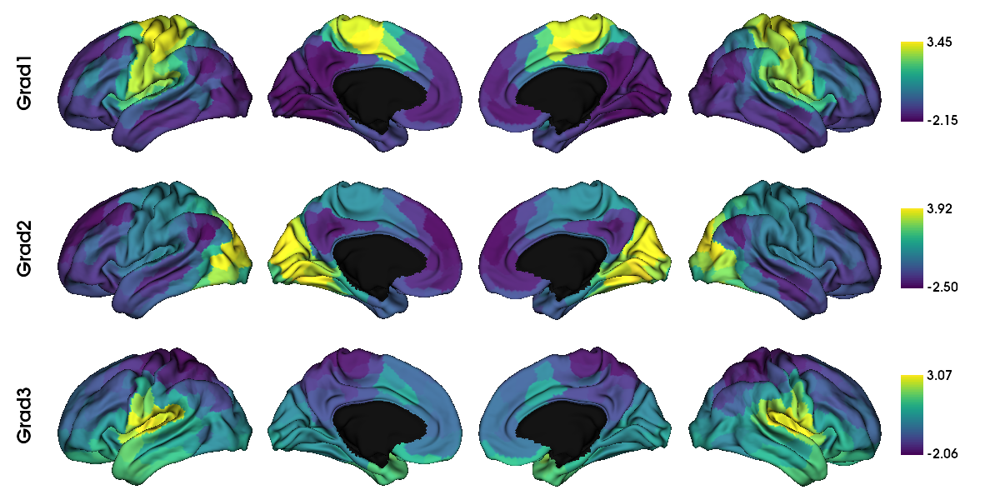

In [96]:
plot_hemispheres(surf_lh, surf_rh, array_name=scz_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [97]:
scz_group_grad_schaefer1000_df = pd.DataFrame(gm.gradients_, columns = ["Grad 1", "Grad 2", "Grad 3"])

In [99]:
fig = px.scatter_3d(scz_group_grad_schaefer1000_df, x="Grad 2", y="Grad 3", z="Grad 1",
              color="Grad 2", color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 2)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

# Neurotypical Controls

In [23]:
control_subjects = np.loadtxt("COBRE_control_subjects.txt", dtype = str)

In [29]:
control_ts = []
for subject in control_subjects:
    subject_ts_path = f"/Users/VictoriaShevchenko/Documents/PhD/COBRE/clean_data/controls/schaefer400/sub-{subject}/func/sub-{subject}_task-rest_space-MNI152NLin2009cAsym_res-2_schaefer400_desc-clean_bold.npy"
    subject_ts = np.load(subject_ts_path)
    subject_ts = np.row_stack(subject_ts)
    control_ts.append(subject_ts)

In [30]:
control_conn_matrices = []
for subject_ts in control_ts:
    #conn = np.corrcoef(subject_ts.T)
    conn = np.arctanh(np.corrcoef(subject_ts.T))
    control_conn_matrices.append(conn)
control_conn_matrices = np.asarray(control_conn_matrices)

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_73600/1602707713.py:4: RuntimeWarning: divide by zero encountered in arctanh
  conn = np.arctanh(np.corrcoef(subject_ts.T))


In [31]:
control_conn_matrices.shape

(91, 400, 400)

In [32]:
control_conn_mean = np.mean(control_conn_matrices, axis = 0)
control_conn_mean = np.tanh(control_conn_mean)
control_conn_mean.shape

(400, 400)

In [33]:
np.save(arr = control_conn_mean, file = "clean_data/gradients/controls/schaefer400/control_group_conn_matrix")

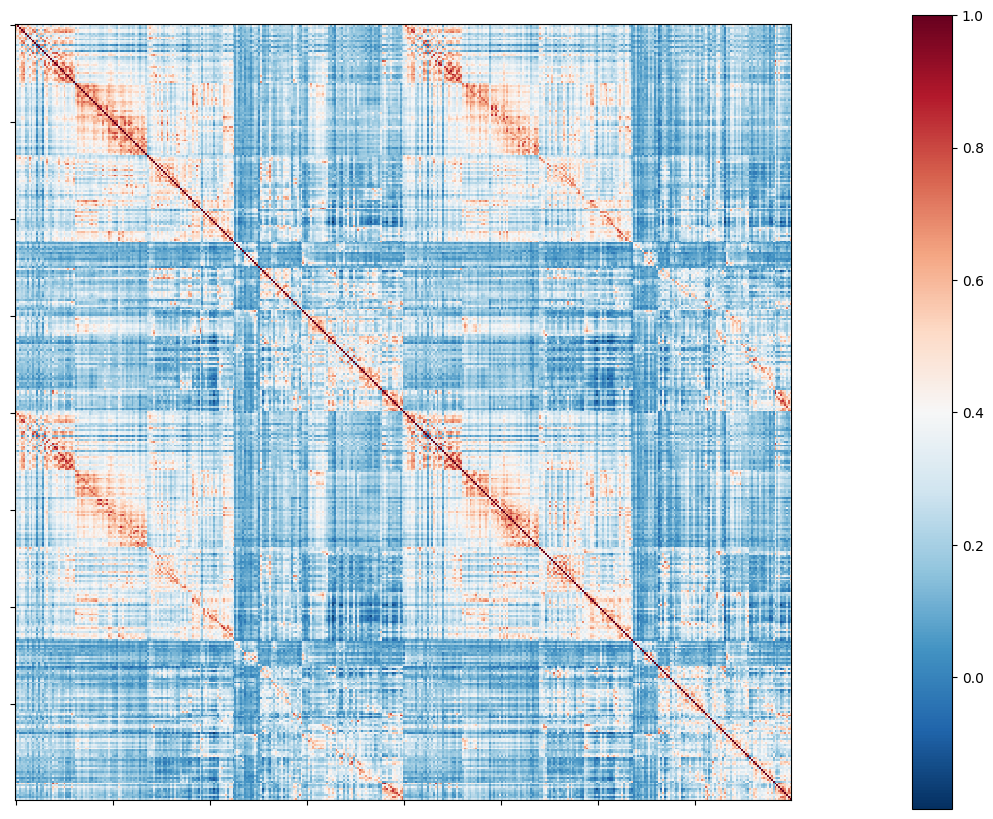

In [34]:
corr_plot = plotting.plot_matrix(control_conn_mean, figure=(10, 10))

In [40]:
gm = GradientMaps(n_components=3, kernel = "cosine", approach= 'pca')
gm.fit(control_conn_mean)

GradientMaps(approach='pca', kernel='cosine', n_components=3)

In [41]:
control_group_grad = [None] * 3

for i, g in enumerate(gm.gradients_.T):
    control_group_grad[i] = map_to_labels(g, schaefer_labels, mask=schaefer_labels != 0, fill=np.nan)

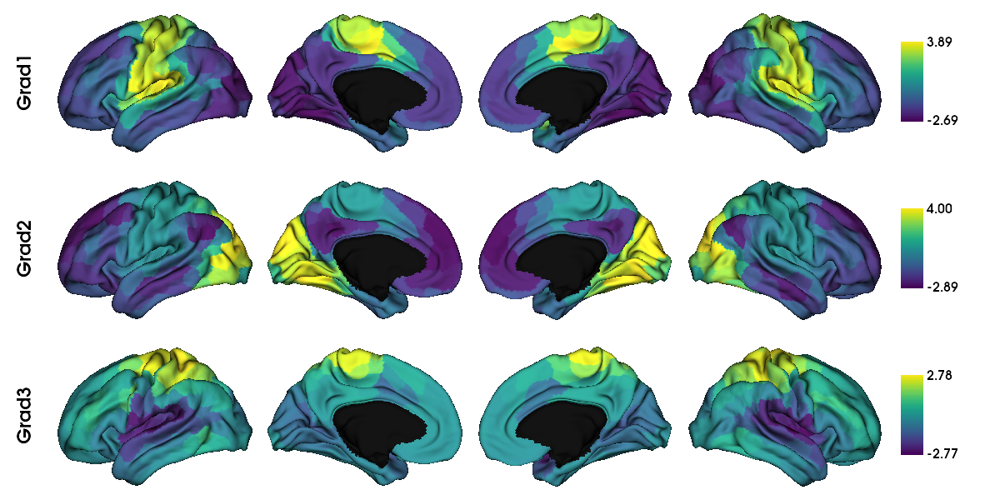

In [39]:

plot_hemispheres(surf_lh, surf_rh, array_name=control_group_grad, size=(1200, 600), cmap='viridis',
                 color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [42]:
np.save(arr = gm.gradients_.T, file = "clean_data/gradients/controls/schaefer400/control_group_grads")

In [132]:
control_group_grad_schaefer1000_df = pd.DataFrame(gm.gradients_, columns = ["Grad 1", "Grad 2", "Grad 3"])


In [133]:
fig = px.scatter_3d(control_group_grad_schaefer1000_df, x="Grad 2", y="Grad 3", z="Grad 1",
              color="Grad 2", color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 2)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )

# Resample Margulies grads

In [5]:
marguluies_grads = np.load("/Users/VictoriaShevchenko/Documents/PhD/margulies_grads_32K.npy")


In [7]:
import hcp_utils as hcp
margulies_grads_labeled = np.array([hcp.cortex_data(i) for i in marguluies_grads])
margulies_grads_labeled.shape

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


(3, 64984)

In [8]:
margulies_grads_schaefer400 = reduce_by_labels(margulies_grads_labeled, labels=schaefer_labels)

NameError: name 'schaefer_labels' is not defined

In [35]:

fig = px.scatter_3d(x=margulies_grads_schaefer400[1], y=margulies_grads_schaefer400[2], z=margulies_grads_schaefer400[0],
              color=margulies_grads_schaefer400[0], color_continuous_scale=px.colors.sequential.Viridis) #color_continuous_scale=['blue','yellow', 'red']

fig.update_traces(marker_size = 3)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="white",
                         gridcolor="rgb(220, 220, 220)",
                         showbackground=True,
                         zerolinecolor="white",
                         title = "Gradient 2",),
                    yaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 3",),
                    zaxis = dict(
                        backgroundcolor="white",
                        gridcolor="rgb(220, 220, 220)",
                        showbackground=True,
                        zerolinecolor="white",
                        title = "Gradient 1",),),
                    width=700,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )